# **MODULE - 1**

In [ ]:
!pip install python_louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import networkx as nx
import collections
import statistics as stats
import time
from matplotlib import pyplot as plt
import seaborn as sns
import json
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms import bipartite
from community import community_louvain # for nxv2

In [ ]:
data1 = pd.read_csv("/content/Dataset1.txt", delimiter = "\t")
data2 = pd.read_csv("/content/Dataset2.txt", delimiter = "\t")
data3 = pd.read_csv("/content/Dataset3.txt", delimiter = "\t")


In [ ]:
data1

,MeSH Disease Term,PubMed occurrence
0,Breast Neoplasms,122226
1,Hypertension,107294
2,Coronary Artery Disease,82819
3,Lung Neoplasms,78009
4,Myocardial Infarction,75945
...,...,...
4437,Mannosidase Deficiency Diseases,1
4438,White Heifer Disease,1
4439,Tetrasomy,1
4440,Milk Sickness,1


In [ ]:
data2


,MeSH Symptom Term,PubMed occurrence
0,Body Weight,147857
1,Pain,103168
2,Obesity,100301
3,Anoxia,47351
4,Mental Retardation,43883
...,...,...
317,Alien Hand Syndrome,10
318,Necrolytic Migratory Erythema,7
319,Body Weight Changes,4
320,Slit Ventricle Syndrome,3


In [ ]:
data3

,MeSH Symptom Term,MeSH Disease Term,PubMed occurrence,TFIDF score
0,"Aging, Premature",Respiratory Syncytial Virus Infections,1,3.464551
1,"Aging, Premature",Orthomyxoviridae Infections,1,3.464551
2,"Aging, Premature",HIV Infections,3,10.393654
3,"Aging, Premature",Acquired Immunodeficiency Syndrome,3,10.393654
4,"Aging, Premature",Breast Neoplasms,1,3.464551
...,...,...,...,...
147973,Hirsutism,Tobacco Use Disorder,1,2.483722
147974,Hirsutism,Radius Fractures,1,2.483722
147975,Hirsutism,Burns,1,2.483722
147976,Hirsutism,Colles' Fracture,1,2.483722


In [ ]:
data_sd = data3[data3["PubMed occurrence"]>=150]

In [ ]:
data_sd = data_sd[data_sd["MeSH Symptom Term"]!=data_sd["MeSH Disease Term"]]

In [ ]:
data_sd

,MeSH Symptom Term,MeSH Disease Term,PubMed occurrence,TFIDF score
668,Fever,Bacterial Infections,651,402.928399
669,Fever,Bacteremia,279,172.683599
816,Fever,Staphylococcal Infections,151,93.459582
837,Fever,Infection,397,245.718240
869,Fever,Sepsis,326,201.773668
...,...,...,...,...
147273,"Urinary Incontinence, Stress",Postoperative Complications,196,549.226490
147461,Virilism,Ovarian Neoplasms,306,681.479134
147530,Virilism,"Adrenal Hyperplasia, Congenital",187,416.459471
147641,Hirsutism,Polycystic Ovary Syndrome,471,1169.833173


In [ ]:
edges = data_sd.reindex(columns=["MeSH Symptom Term","MeSH Disease Term"])
edges

,MeSH Symptom Term,MeSH Disease Term
668,Fever,Bacterial Infections
669,Fever,Bacteremia
816,Fever,Staphylococcal Infections
837,Fever,Infection
869,Fever,Sepsis
...,...,...
147273,"Urinary Incontinence, Stress",Postoperative Complications
147461,Virilism,Ovarian Neoplasms
147530,Virilism,"Adrenal Hyperplasia, Congenital"
147641,Hirsutism,Polycystic Ovary Syndrome


In [ ]:
part0 = edges['MeSH Symptom Term'].unique()
len(part0)

171

In [ ]:
part0

array(['Fever', 'Fever of Unknown Origin', 'Hypothermia', 'Body Weight',
       'Birth Weight', 'Fetal Macrosomia', 'Weight Gain', 'Weight Loss',
       'Cachexia', 'Overweight', 'Obesity', 'Obesity, Morbid', 'Thinness',
       'Cardiac Output, Low', 'Cyanosis', 'Edema', 'Hydrops Fetalis',
       'Fatigue', 'Fetal Distress', 'Hot Flashes',
       'Hypergammaglobulinemia', 'Intermittent Claudication',
       'Neurologic Manifestations', 'Dyskinesias', 'Ataxia',
       'Cerebellar Ataxia', 'Athetosis', 'Chorea', 'Dystonia',
       'Torticollis', 'Hyperkinesis', 'Hypokinesia', 'Myoclonus',
       'Psychomotor Agitation', 'Akathisia, Drug-Induced', 'Tics',
       'Tremor', 'Gait Disorders, Neurologic', 'Apraxias', 'Catatonia',
       'Language Disorders', 'Anomia', 'Dyslexia',
       'Language Development Disorders', 'Speech Disorders', 'Aphasia',
       'Aphasia, Broca', 'Aphasia, Wernicke', 'Dysarthria',
       'Learning Disorders', 'Confusion', 'Delirium',
       'Consciousness Disorder

In [ ]:
part1 = edges['MeSH Disease Term'].unique()
len(part1)

430

In [ ]:
part1

array(['Bacterial Infections', 'Bacteremia', 'Staphylococcal Infections',
       'Infection', 'Sepsis', 'Urinary Tract Infections', 'Common Cold',
       'HIV Infections', 'Malaria', 'Malaria, Falciparum', 'Leukemia',
       'Pneumonia', 'Seizures', 'Pain', 'Agranulocytosis', 'Neutropenia',
       'Skin Diseases', 'Drug Hypersensitivity', 'Inflammation',
       'Postoperative Complications', 'Heart Arrest',
       'Polycystic Ovary Syndrome', 'Adenocarcinoma', 'Breast Neoplasms',
       'Colonic Neoplasms', 'Liver Neoplasms',
       'Liver Neoplasms, Experimental', 'Pancreatic Neoplasms',
       'Mammary Neoplasms, Experimental', 'Lung Neoplasms',
       'Prostatic Neoplasms', 'Neoplasms, Experimental', 'Osteoporosis',
       'Fatty Liver', 'Cystic Fibrosis', 'Asthma', 'Kidney Diseases',
       'Diabetic Nephropathies', 'Hypertension, Renal',
       'Kidney Failure, Chronic', 'Uremia', 'Pregnancy Complications',
       'Fetal Growth Retardation', 'Pregnancy in Diabetics',
       'Cardi

In [ ]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [ ]:
# Find common symptoms - diseases, not useful 
comm = intersection(part0, part1)
len(comm)

69

In [ ]:
comm

['Fetal Macrosomia',
 'Obesity',
 'Obesity, Morbid',
 'Athetosis',
 'Chorea',
 'Dystonia',
 'Apraxias',
 'Language Disorders',
 'Dyslexia',
 'Language Development Disorders',
 'Speech Disorders',
 'Aphasia',
 'Aphasia, Broca',
 'Aphasia, Wernicke',
 'Dysarthria',
 'Learning Disorders',
 'Coma',
 'Syncope',
 'Memory Disorders',
 'Amnesia',
 'Amnesia, Retrograde',
 'Mental Retardation',
 'Phantom Limb',
 'Muscle Spasticity',
 'Muscle Weakness',
 'Pain',
 'Back Pain',
 'Low Back Pain',
 'Facial Pain',
 'Headache',
 'Neuralgia',
 'Sciatica',
 'Paralysis',
 'Facial Paralysis',
 'Hemiplegia',
 'Ophthalmoplegia',
 'Paraplegia',
 'Quadriplegia',
 'Paresis',
 'Seizures',
 'Dizziness',
 'Hearing Disorders',
 'Hearing Loss',
 'Deafness',
 'Hearing Loss, Bilateral',
 'Hearing Loss, Conductive',
 'Hearing Loss, Sensorineural',
 'Hearing Loss, Sudden',
 'Tinnitus',
 'Olfaction Disorders',
 'Hyperalgesia',
 'Taste Disorders',
 'Vision Disorders',
 'Blindness',
 'Sleep Disorders',
 'Urinary Bladder, N

In [ ]:
# Remove the rows that are in comm
edges = edges[~edges['MeSH Symptom Term'].isin(comm)]


In [ ]:
# Delete duplicate rows
edges_ = edges.drop_duplicates(subset=["MeSH Symptom Term","MeSH Disease Term"], keep=False)

In [ ]:
edges_

,MeSH Symptom Term,MeSH Disease Term
668,Fever,Bacterial Infections
669,Fever,Bacteremia
816,Fever,Staphylococcal Infections
837,Fever,Infection
869,Fever,Sepsis
...,...,...
147273,"Urinary Incontinence, Stress",Postoperative Complications
147461,Virilism,Ovarian Neoplasms
147530,Virilism,"Adrenal Hyperplasia, Congenital"
147641,Hirsutism,Polycystic Ovary Syndrome


In [ ]:
part0 = edges_['MeSH Symptom Term'].unique()
#part0

In [ ]:
part1 = edges_['MeSH Disease Term'].unique()
#part1

In [ ]:
## Symptom // Disease
joins = list(edges_.to_records(index=False))
#joins

In [ ]:
BI = nx.Graph()
BI.add_nodes_from(part0, bipartite=0)
BI.add_nodes_from(part1, bipartite=1)
BI.add_edges_from(joins)

In [ ]:
# Taking the largest connected component
components = sorted(nx.connected_components(BI), key=len, reverse=True)
largest_component = components[0]
BII = BI.subgraph(largest_component)

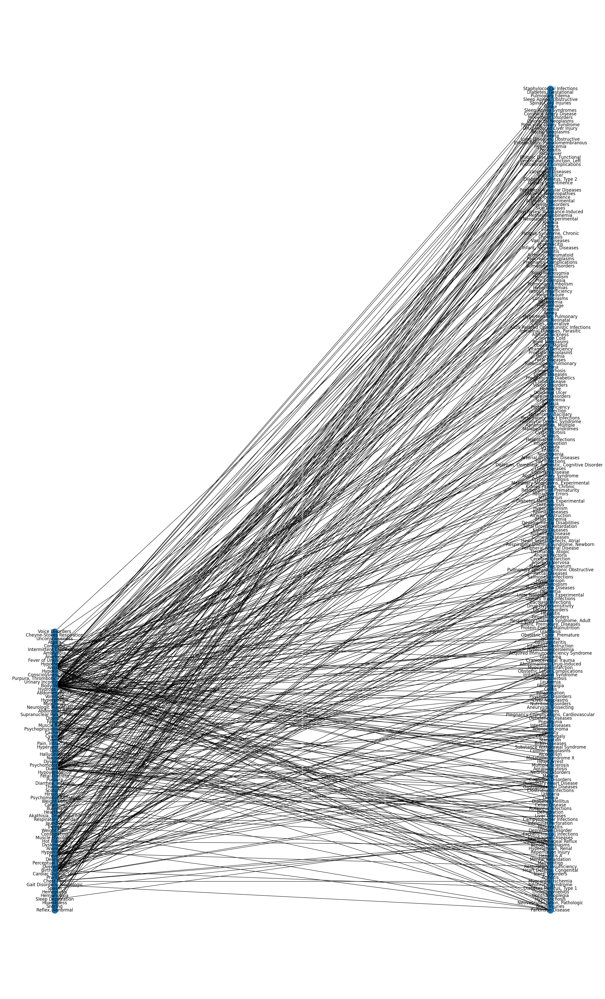

In [ ]:
## Symptoms // Diseases

fig = plt.figure(figsize = (30, 50))
ax = fig.add_subplot(111)
ax.axis('off')

N1, N2 = bipartite.sets(BII)
pos = dict()
pos.update( (n, (1, i)) for i, n in enumerate(N1) ) # put nodes from N1
pos.update( (n, (2, i)) for i, n in enumerate(N2) ) # put nodes from N2
nx.draw(BII, pos=pos, with_labels=True)
plt.show()

In [ ]:
!pip install networkx 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
Gph_N1 = bipartite.projected_graph(BII, N1, multigraph=False)
Gph_N2 = bipartite.projected_graph(BII, N2, multigraph=False)


Time elapsed to get the graph layout:  0.0312349796295166


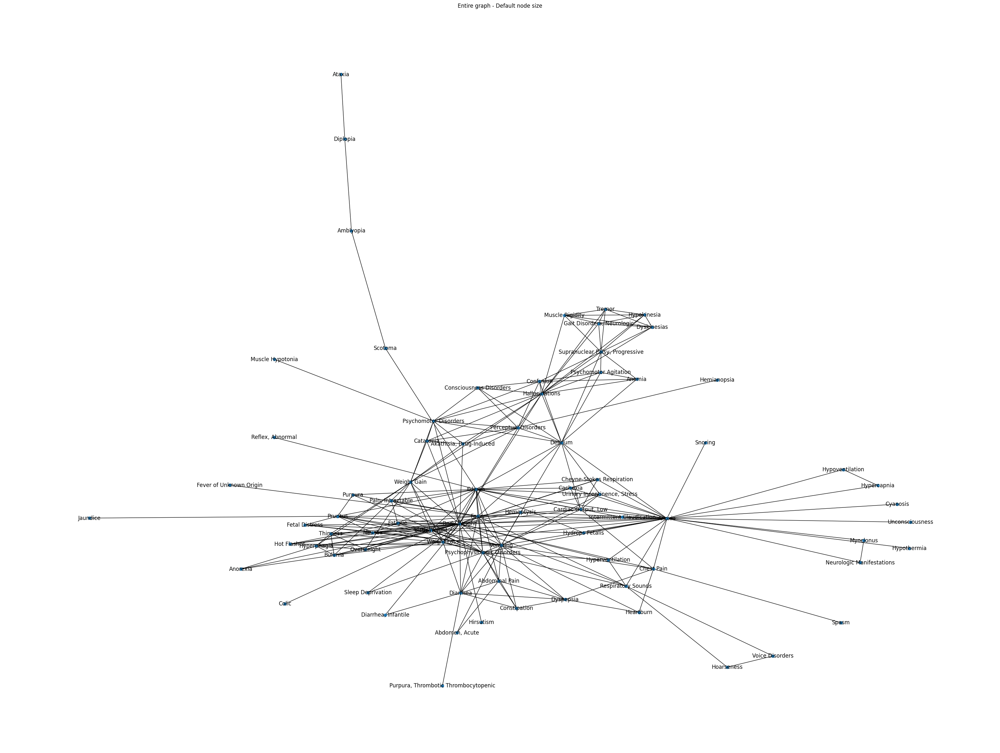

In [ ]:
t = time.time()
spring_pos = nx.spring_layout(Gph_N1) # might take a little while
elapsed = time.time() - t
print('Time elapsed to get the graph layout: ', elapsed)
fig = plt.figure(figsize = (40, 30))
ax = fig.add_subplot(111)
ax.axis('off')

node_size_default = 40

n = nx.draw_networkx(Gph_N1, 
                     spring_pos,
                     ax = ax,
                     node_size = node_size_default,
                     with_labels = True)
plt.title("Entire graph - Default node size")
plt.close();

fig

Time elapsed to get the graph layout:  0.1608426570892334


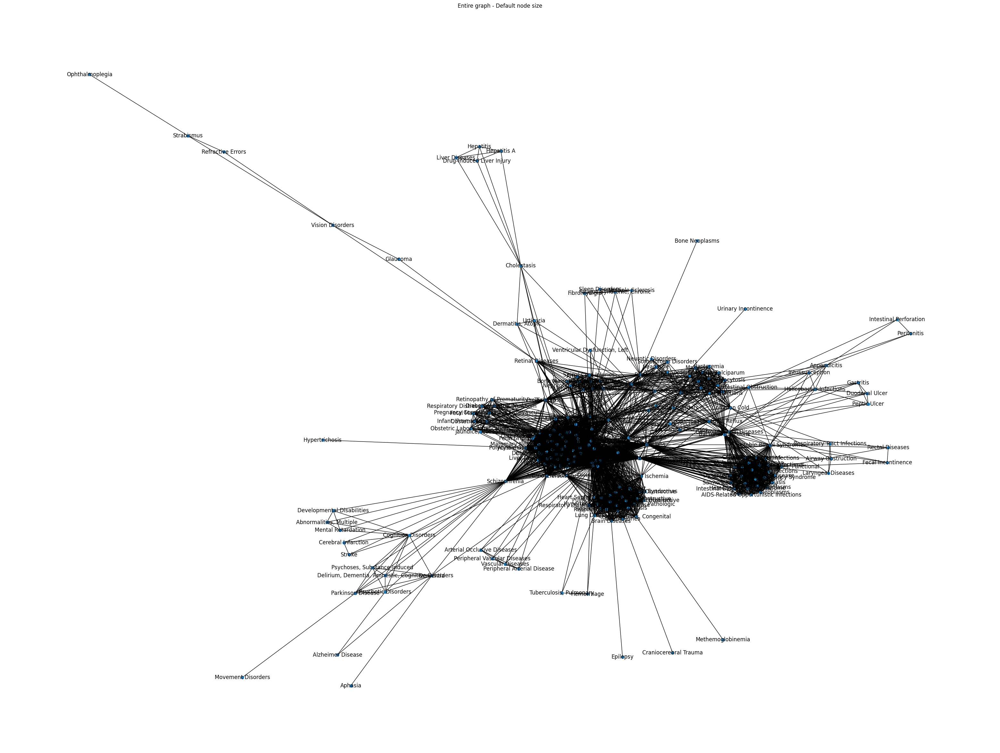

In [ ]:
t = time.time()
spring_pos = nx.spring_layout(Gph_N2) # might take a little while
elapsed = time.time() - t
print('Time elapsed to get the graph layout: ', elapsed)
fig = plt.figure(figsize = (40, 30))
ax = fig.add_subplot(111)
ax.axis('off')

node_size_default = 40

n = nx.draw_networkx(Gph_N2, 
                     spring_pos,
                     ax = ax,
                     node_size = node_size_default,
                     with_labels = True)
plt.title("Entire graph - Default node size")
plt.close();

fig

In [ ]:
# Network metric statistics
def network_metric_statistics(metric_data):
    avg = stats.mean(metric_data)
    med = stats.median(metric_data)
    std = stats.stdev(metric_data)
    
    return("Here is a quick summary of your data: average = " + '{:.5f}'.format(avg) + ", median = " + '{:.5f}'.format(med) + ", standard deviation = " + '{:.5f}'.format(std))

# **Degree - Symptoms**

In [ ]:
N1s = [d for d in N1]
N1s_degrees = [Gph_N1.degree[d] for d in N1]

In [ ]:
N1s_order = [x for y, x in sorted(zip(N1s_degrees, N1s), reverse=True)]
N1s_degrees_order = sorted((Gph_N1.degree[d] for d in N1), reverse=True)

In [ ]:
print("TOP 5 N1: \n",N1s_order[:5]) # from largest to smallest degree value
print("TOP 5 N1 DEGREES: \n",N1s_degrees_order[:5]) # from largest to smallest degree value

TOP 5 N1: 
 ['Body Weight', 'Anoxia', 'Vomiting', 'Edema', 'Psychophysiologic Disorders']
TOP 5 N1 DEGREES: 
 [36, 26, 22, 21, 18]


In [ ]:
network_metric_statistics(N1s_degrees_order)

'Here is a quick summary of your data: average = 6.46154, median = 5.00000, standard deviation = 6.31776'

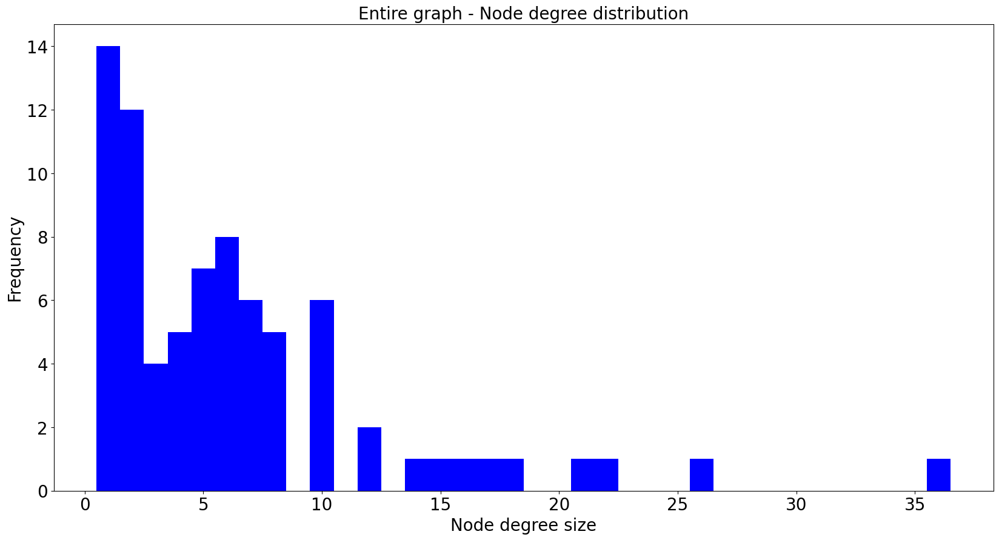

In [ ]:
degree_count = collections.Counter(N1s_degrees_order)
deg, cnt = zip(*degree_count.items())

plt.figure(figsize=(20,10))

plt.bar(deg, cnt, width=1, color='b')
plt.xlabel("Node degree size", fontsize=20)
plt.ylabel("Frequency", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title("Entire graph - Node degree distribution", fontsize=20)
plt.show()

# **Degree Disease**

In [ ]:
N2s = [d for d in N2]
N2s_degrees = [Gph_N2.degree[d] for d in N2]

In [ ]:
N2s_order = [x for y, x in sorted(zip(N2s_degrees, N2s), reverse=True)]
N2s_degrees_order = sorted((Gph_N2.degree[d] for d in N2), reverse=True)

In [ ]:
print("TOP 5 N2: \n",N2s_order[:5]) # from largest to smallest degree value
print("TOP 5 N2 DEGREES: \n",N2s_degrees_order[:5]) # from largest to smallest degree value

TOP 5 N2: 
 ['Hypertension', 'Heart Failure', 'HIV Infections', 'Asthma', 'Myocardial Infarction']
TOP 5 N2 DEGREES: 
 [123, 109, 107, 104, 98]


In [ ]:
network_metric_statistics(N2s_degrees_order)

'Here is a quick summary of your data: average = 34.00877, median = 31.00000, standard deviation = 26.74302'

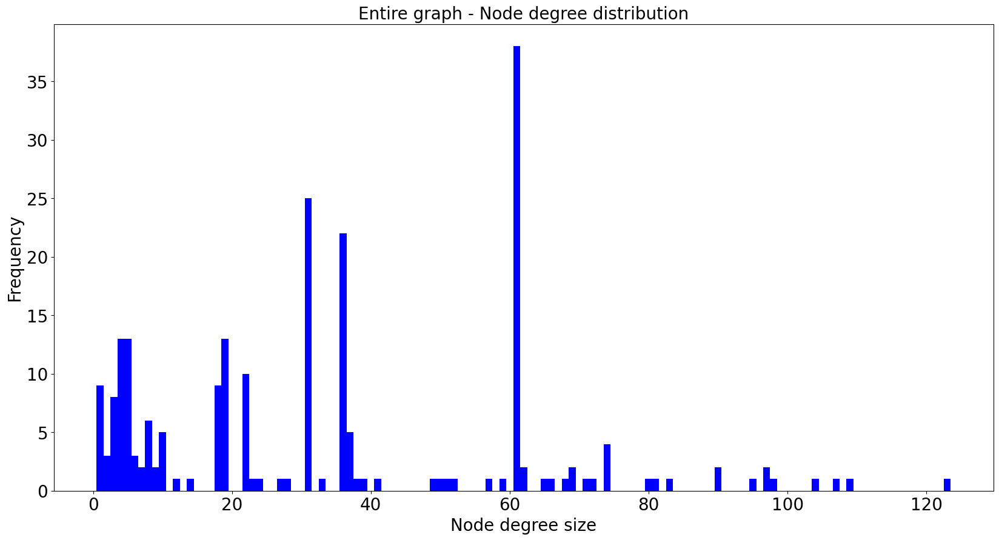

In [ ]:
degree_count = collections.Counter(N2s_degrees_order)
deg, cnt = zip(*degree_count.items())

plt.figure(figsize=(20,10))

plt.bar(deg, cnt, width=1, color='b')
plt.xlabel("Node degree size", fontsize=20)
plt.ylabel("Frequency", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title("Entire graph - Node degree distribution", fontsize=20)
plt.show()

# **Centrality symptoms**

In [ ]:
# degree centrality
deg = nx.degree_centrality(Gph_N1)
sorted(deg.items(), key=lambda item: item[1], reverse=True)[:5]

[('Body Weight', 0.4675324675324676),
 ('Anoxia', 0.33766233766233766),
 ('Vomiting', 0.28571428571428575),
 ('Edema', 0.27272727272727276),
 ('Psychophysiologic Disorders', 0.2337662337662338)]

In [ ]:
# closeness centrality
closeness = nx.closeness_centrality(Gph_N1)
sorted(closeness.items(), key=lambda item: item[1], reverse=True)[:5]

[('Body Weight', 0.6209677419354839),
 ('Anoxia', 0.5384615384615384),
 ('Edema', 0.5238095238095238),
 ('Vomiting', 0.5238095238095238),
 ('Fever', 0.506578947368421)]

In [ ]:
# eigenvector centrality
eig = nx.eigenvector_centrality(Gph_N1)
sorted(eig.items(), key=lambda item: item[1], reverse=True)[:5]

[('Body Weight', 0.38651154008033856),
 ('Vomiting', 0.2827224283691103),
 ('Edema', 0.2737104582303614),
 ('Anoxia', 0.27134204420079133),
 ('Psychophysiologic Disorders', 0.2505406825906348)]

In [ ]:
# betweeness centrality
betw = nx.betweenness_centrality(Gph_N1)
sorted(betw.items(), key=lambda item: item[1], reverse=True)[:5]

[('Body Weight', 0.37895042386970734),
 ('Anoxia', 0.23426722871256667),
 ('Edema', 0.1666075368816513),
 ('Hallucinations', 0.13184664615447458),
 ('Delirium', 0.12242212674543504)]

# **Centrality Diseases**

In [ ]:
# degree centrality
deg = nx.degree_centrality(Gph_N2)
sorted(deg.items(), key=lambda item: item[1], reverse=True)[:5]

[('Hypertension', 0.5418502202643173),
 ('Heart Failure', 0.48017621145374456),
 ('HIV Infections', 0.4713656387665199),
 ('Asthma', 0.4581497797356829),
 ('Myocardial Infarction', 0.43171806167400884)]

In [ ]:
# closeness centrality
closeness = nx.closeness_centrality(Gph_N2)
sorted(closeness.items(), key=lambda item: item[1], reverse=True)[:5]

[('Hypertension', 0.6598837209302325),
 ('Heart Failure', 0.6253443526170799),
 ('HIV Infections', 0.6168478260869565),
 ('Asthma', 0.6168478260869565),
 ('Myocardial Infarction', 0.5989445910290238)]

In [ ]:
# eigenvector centrality
eig = nx.eigenvector_centrality(Gph_N2)
sorted(eig.items(), key=lambda item: item[1], reverse=True)[:5]

[('Hypertension', 0.14411088164328226),
 ('Heart Failure', 0.14058387055664193),
 ('Asthma', 0.13816867242484468),
 ('Myocardial Infarction', 0.13660841918400032),
 ('Coronary Disease', 0.13652641764271337)]

In [ ]:
# betweeness centrality
betw = nx.betweenness_centrality(Gph_N2)
sorted(betw.items(), key=lambda item: item[1], reverse=True)[:5]

[('Postoperative Complications', 0.09447852396103926),
 ('Schizophrenia', 0.0889245355809576),
 ('HIV Infections', 0.08317374828593277),
 ('Hypertension', 0.0706980240632391),
 ('Gastrointestinal Diseases', 0.06713498734213372)]

# **Communties with Louvain : Symptoms**

In [ ]:
spring_pos = nx.spring_layout(Gph_N1) # might take a little while
node_size_default = 40

In [ ]:
# partition = community.best_partition(GC) # idk if this works for v1 
partition = community_louvain.best_partition(Gph_N1)
communities = [partition.get(node) for node in Gph_N1.nodes()]
print('The number of communities is ' + str(max(communities)) + '.')

The number of communities is 5.


In [ ]:
# Let's assign each node to its given community
nx.set_node_attributes(Gph_N1, partition, name='community')

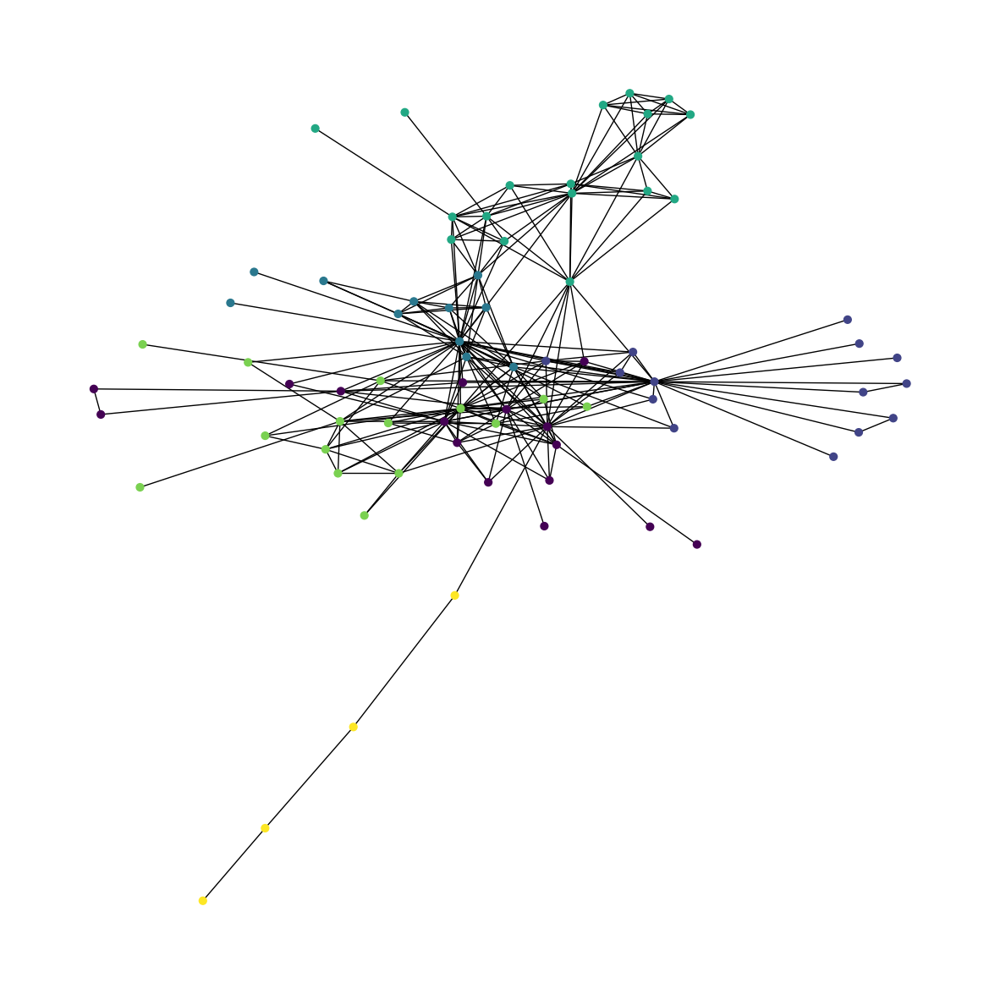

In [ ]:
colors = [Gph_N1.nodes[n]['community'] for n in Gph_N1.nodes]

fig = plt.figure(figsize = (15, 15))
ax = fig.add_subplot(111)
ax.axis('off')

n = nx.draw_networkx(Gph_N1, 
        spring_pos, 
        ax = ax, 
        node_size = node_size_default,
        with_labels = False,
        node_color = communities)

plt.close();
fig

# **Communities with Louvain : Diseases**

In [ ]:
spring_pos = nx.spring_layout(Gph_N2) # might take a little while
node_size_default = 40

In [ ]:
# partition = community.best_partition(GC) # idk if this works for v1 
partition = community_louvain.best_partition(Gph_N2)
communities = [partition.get(node) for node in Gph_N2.nodes()]
num_communities = max(communities)+1

print('The number of communities is ' + str(num_communities))

The number of communities is 7


In [ ]:
# Let's assign each node to its given community
nx.set_node_attributes(Gph_N2, partition, name='community')

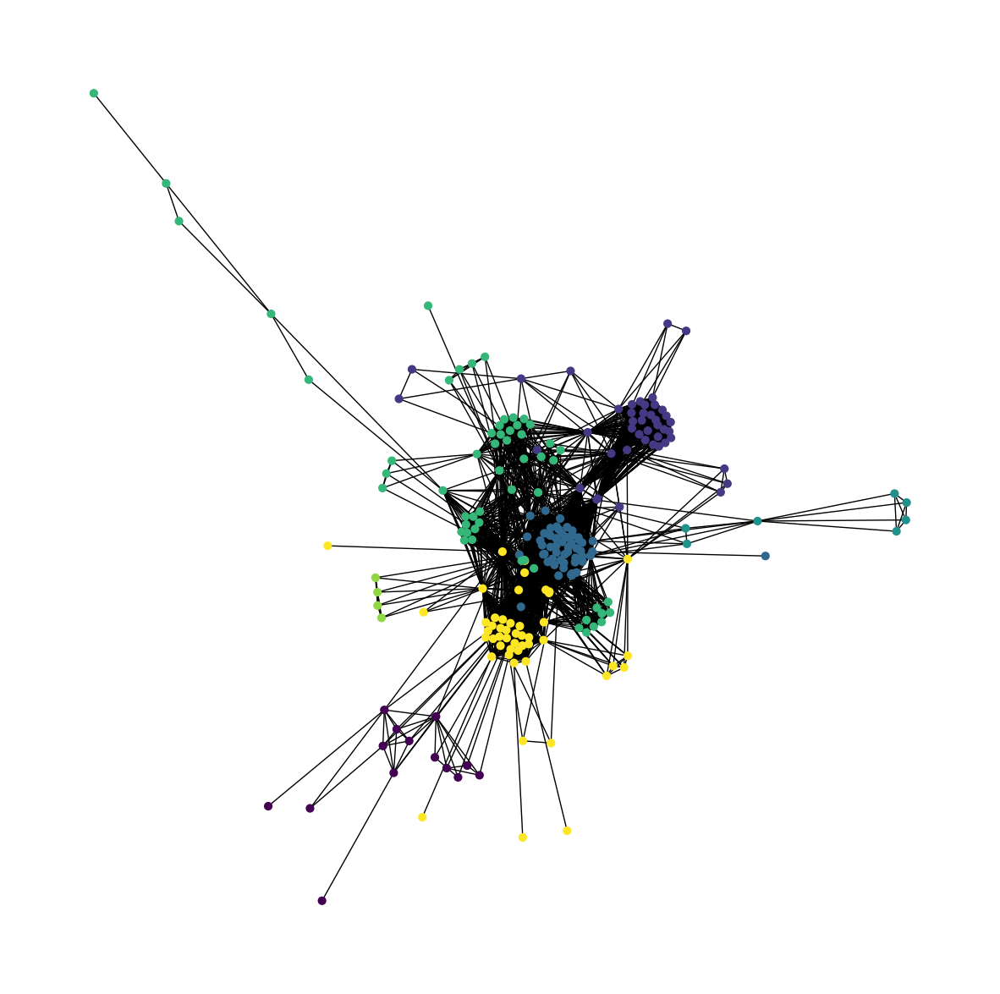

In [ ]:
colors = [Gph_N2.nodes[n]['community'] for n in Gph_N2.nodes]

fig = plt.figure(figsize = (15, 15))
ax = fig.add_subplot(111)
ax.axis('off')

n = nx.draw_networkx(Gph_N2, 
        spring_pos, 
        ax = ax, 
        node_size = node_size_default,
        with_labels = False,
        node_color = communities)

plt.close();
fig

In [ ]:
res = {}
for i, v in partition.items():
    res[v] = [i] if v not in res.keys() else res[v] + [i]
print(res)

{0: ['Parkinson Disease', 'Mental Retardation', 'Cognition Disorders', 'Psychotic Disorders', 'Dementia', 'Cerebral Infarction', 'Alzheimer Disease', 'Developmental Disabilities', 'Delirium, Dementia, Amnestic, Cognitive Disorders', 'Abnormalities, Multiple', 'Aphasia', 'Psychoses, Substance-Induced', 'Movement Disorders', 'Stroke'], 6: ['Brain Injuries', 'Neovascularization, Pathologic', 'Myocardial Ischemia', 'Heart Defects, Congenital', 'Respiratory Insufficiency', 'Reperfusion Injury', 'Gastroesophageal Reflux', 'Esophageal Diseases', 'Pulmonary Heart Disease', 'Heart Arrest', 'Brain Diseases', 'Aneurysm, Dissecting', 'Myocardial Infarction', 'Craniocerebral Trauma', 'Ischemia', 'Respiratory Distress Syndrome, Adult', 'Pulmonary Disease, Chronic Obstructive', 'Angina Pectoris', 'Heart Septal Defects, Atrial', 'Brain Ischemia', 'Acute Coronary Syndrome', 'Coronary Disease', 'Lung Diseases', 'Dyspnea', 'Acidosis', 'Liver Cirrhosis', 'Asthma', 'Tuberculosis, Pulmonary', 'Fetal Disease

In [ ]:
print(res[0])

['Parkinson Disease', 'Mental Retardation', 'Cognition Disorders', 'Psychotic Disorders', 'Dementia', 'Cerebral Infarction', 'Alzheimer Disease', 'Developmental Disabilities', 'Delirium, Dementia, Amnestic, Cognitive Disorders', 'Abnormalities, Multiple', 'Aphasia', 'Psychoses, Substance-Induced', 'Movement Disorders', 'Stroke']


In [ ]:
def process_one_community(community_val):

    # Consider the rows that are in comm with the disseases of the commmmunity
    edges_tmp = edges_[edges_['MeSH Disease Term'].isin(community_val)]
    
    syms_sorted_top = ["none"]
    percent = 0
    name_community = "none"
    
    # filter communities with only more than 3 nodes of symptoms
    if len(edges_tmp['MeSH Symptom Term'].unique())>3:

        # Both parts of the bipartie
        part0_tmp = edges_tmp['MeSH Symptom Term'].unique()
        part1_tmp = edges_tmp['MeSH Disease Term'].unique()

        # Symptom // Disease
        joins_tmp = list(edges_tmp.to_records(index=False))

        # Start Bigraph
        BI_tmp = nx.Graph()
        BI_tmp.add_nodes_from(part0_tmp, bipartite=0)
        BI_tmp.add_nodes_from(part1_tmp, bipartite=1)
        BI_tmp.add_edges_from(joins_tmp)


        # Taking the largest connected component
        #components = sorted(nx.connected_components(BI_tmp), key=len, reverse=True)
        #largest_component = components[0]
        #BII_tmp = BI_tmp.subgraph(largest_component)

        # Graph: Symptoms // Diseases
        fig = plt.figure(figsize = (12, 12))
        ax = fig.add_subplot(111)
        ax.axis('off')
        N1, N2 = bipartite.sets(BI_tmp)
        pos = dict()
        pos.update( (n, (1, i)) for i, n in enumerate(N1) ) # put nodes from N1
        pos.update( (n, (2, i)) for i, n in enumerate(N2) ) # put nodes from N2
        nx.draw(BI_tmp, pos=pos, with_labels=True)
        plt.show()

        # extract degrees
        degX, degY = bipartite.degrees(BI_tmp, N1)
        degY = dict(degY)
        syms_sorted = dict(sorted(degY.items(), key=lambda item: item[1], reverse=True))

        # printing the sorted symptoms
        for key, value in syms_sorted.items():
            print(key, ': ', value)

        for diss in list(N2):
            if diss =="Cognition Disorders":
                name_community = "Mental disorders"
            if diss =="Bacterial Infections":
                name_community = "Bacterial infections"
            if diss =="Deficiency Diseases":
                name_community = "Malnutrition deficiency"
            if diss =="Lung Diseases":
                name_community = "Lung or heart problems"
            if diss =="Corneal Diseases":
                name_community = "Vision or Pregnancy problems"
          
        print("\nName community: ",name_community)

        # select only the top symptoms with more or equal to 3 degree
        syms_sorted_top = [k for k,v in syms_sorted.items() if float(v) >= 3]

        # select the edges of the top symptoms 
        edges_tmp2 = edges_tmp[edges_tmp['MeSH Symptom Term'].isin(syms_sorted_top)]

        # number of partial diseases detected with the symptoms in the community
        partial_diseas_ = len(edges_tmp2['MeSH Disease Term'])
        
        # only for verfication
        #print(edges_tmp2['MeSH Disease Term'].unique())

        # number of all diseases in the community
        all_diseas_ = len(edges_tmp['MeSH Disease Term'])

        percent = round(partial_diseas_*100/all_diseas_,2)

        print("\nTop symptoms:", syms_sorted_top)

        print("\nTop symptoms detects the", str(percent), "%", "of the diseases in the community")
    
    else:
        print("\nCommunity too small")

    return syms_sorted_top, percent, name_community



----------------------------------------------------------------------------------------------
0


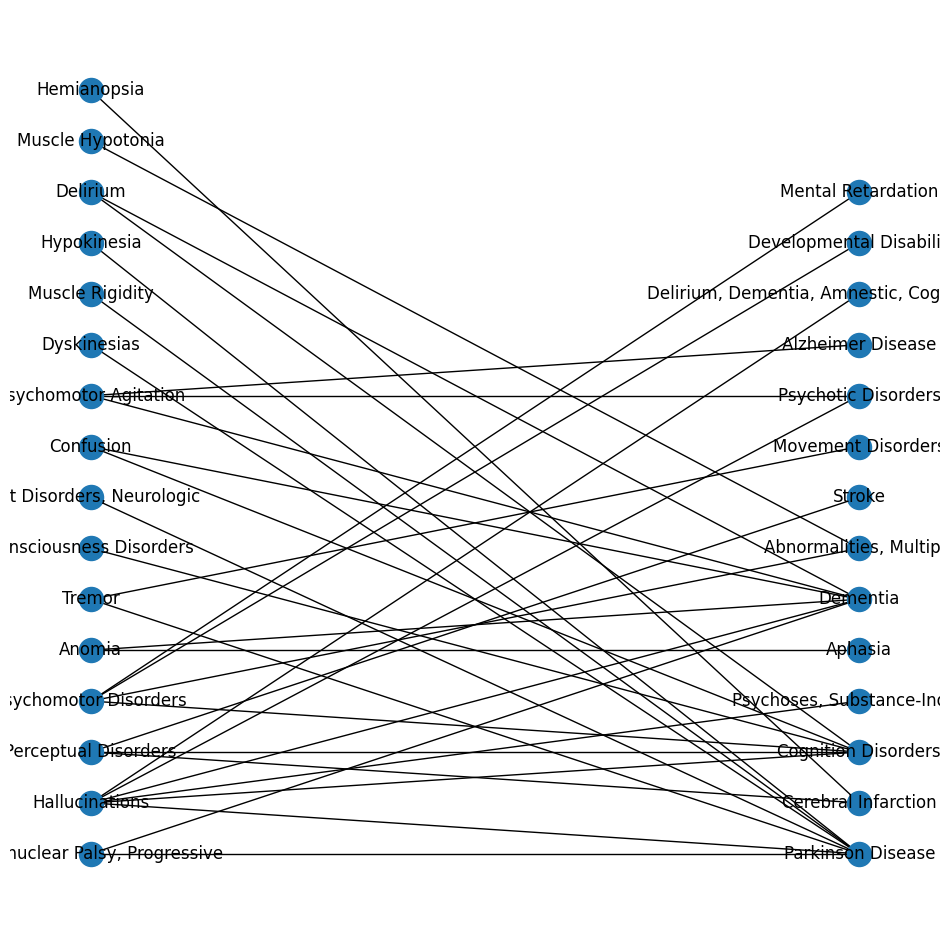

Hallucinations :  6
Psychomotor Disorders :  4
Perceptual Disorders :  3
Psychomotor Agitation :  3
Supranuclear Palsy, Progressive :  2
Delirium :  2
Anomia :  2
Tremor :  2
Confusion :  2
Consciousness Disorders :  1
Muscle Hypotonia :  1
Hypokinesia :  1
Hemianopsia :  1
Gait Disorders, Neurologic :  1
Dyskinesias :  1
Muscle Rigidity :  1

Name community:  Mental disorders

Top symptoms: ['Hallucinations', 'Psychomotor Disorders', 'Perceptual Disorders', 'Psychomotor Agitation']

Top symptoms detects the 48.48 % of the diseases in the community


----------------------------------------------------------------------------------------------
1


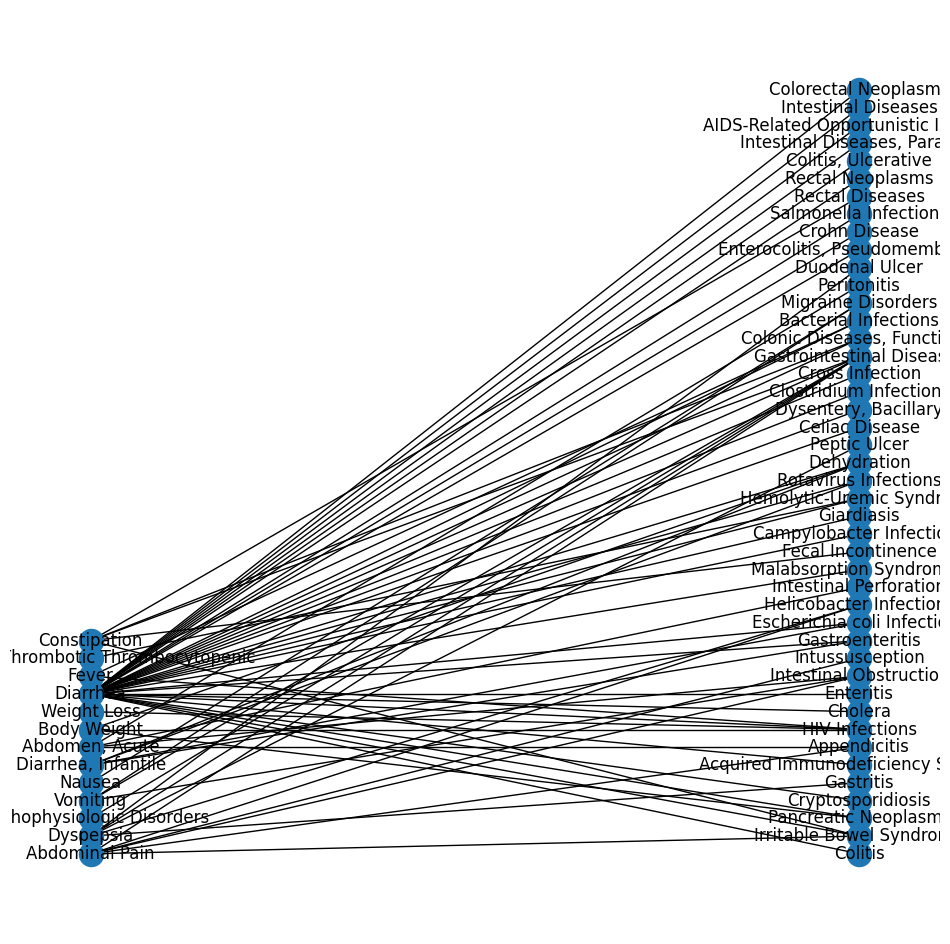

Diarrhea :  32
Abdominal Pain :  6
Dyspepsia :  5
Constipation :  5
Diarrhea, Infantile :  4
Abdomen, Acute :  4
Vomiting :  3
Body Weight :  3
Fever :  2
Psychophysiologic Disorders :  1
Nausea :  1
Weight Loss :  1
Purpura, Thrombotic Thrombocytopenic :  1

Name community:  Bacterial infections

Top symptoms: ['Diarrhea', 'Abdominal Pain', 'Dyspepsia', 'Constipation', 'Diarrhea, Infantile', 'Abdomen, Acute', 'Vomiting', 'Body Weight']

Top symptoms detects the 91.18 % of the diseases in the community


----------------------------------------------------------------------------------------------
2


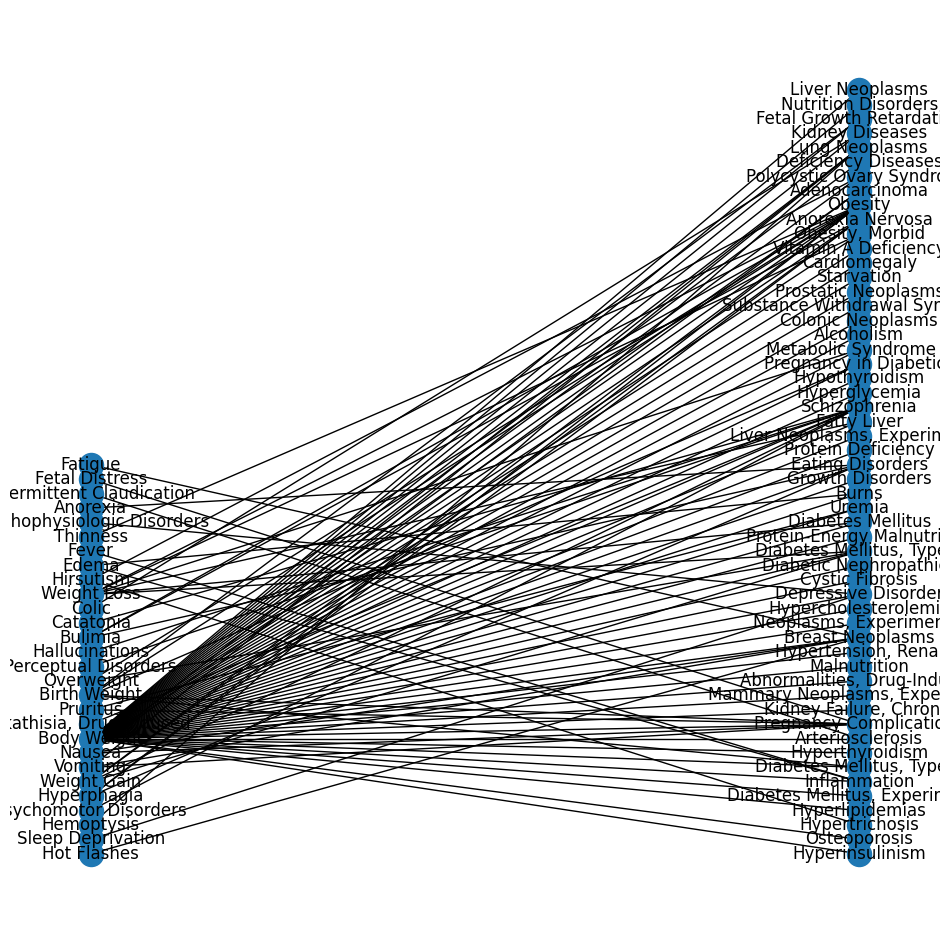

Body Weight :  53
Weight Loss :  6
Birth Weight :  5
Weight Gain :  4
Nausea :  4
Bulimia :  3
Hyperphagia :  3
Vomiting :  3
Hirsutism :  2
Edema :  2
Pruritus :  2
Overweight :  2
Perceptual Disorders :  1
Hot Flashes :  1
Hallucinations :  1
Catatonia :  1
Colic :  1
Sleep Deprivation :  1
Hemoptysis :  1
Fever :  1
Psychomotor Disorders :  1
Thinness :  1
Psychophysiologic Disorders :  1
Anorexia :  1
Fatigue :  1
Intermittent Claudication :  1
Akathisia, Drug-Induced :  1
Fetal Distress :  1

Name community:  Malnutrition deficiency

Top symptoms: ['Body Weight', 'Weight Loss', 'Birth Weight', 'Weight Gain', 'Nausea', 'Bulimia', 'Hyperphagia', 'Vomiting']

Top symptoms detects the 77.14 % of the diseases in the community


----------------------------------------------------------------------------------------------
3

Community too small


----------------------------------------------------------------------------------------------
4


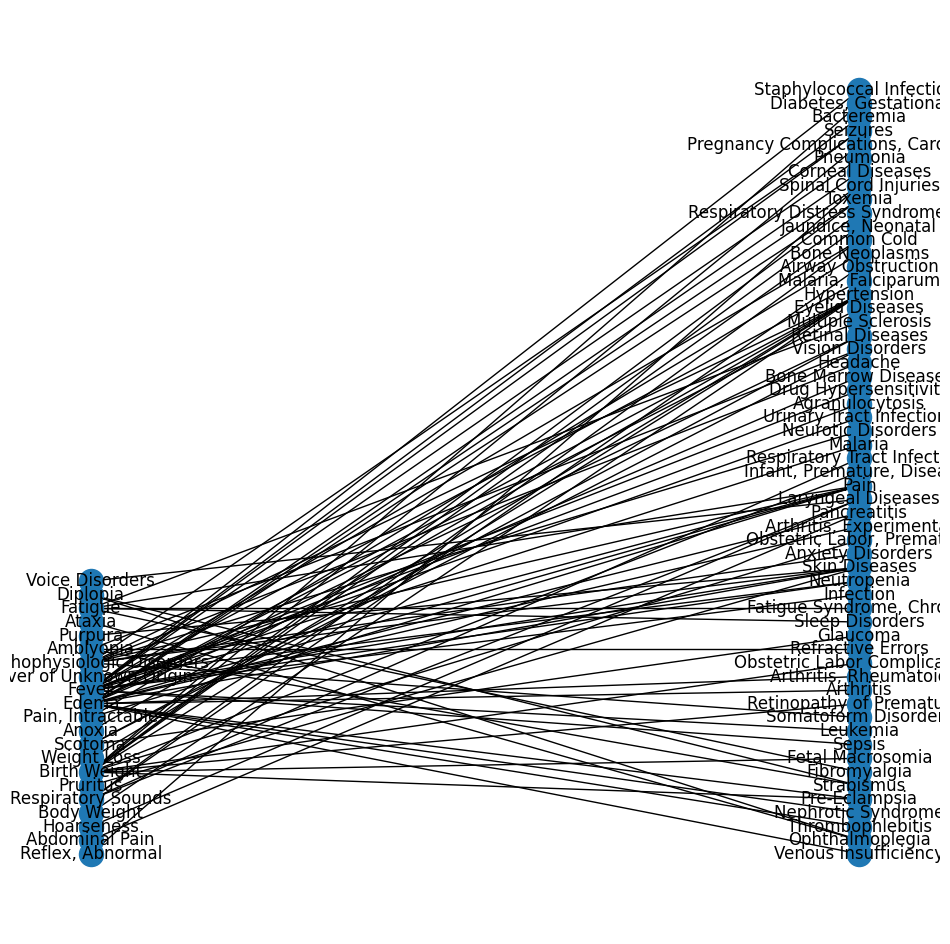

Edema :  17
Fever :  16
Birth Weight :  12
Psychophysiologic Disorders :  8
Fatigue :  5
Respiratory Sounds :  4
Scotoma :  3
Amblyopia :  3
Pain, Intractable :  2
Diplopia :  2
Reflex, Abnormal :  1
Abdominal Pain :  1
Hoarseness :  1
Weight Loss :  1
Anoxia :  1
Fever of Unknown Origin :  1
Body Weight :  1
Purpura :  1
Pruritus :  1
Ataxia :  1
Voice Disorders :  1

Name community:  Vision or Pregnancy problems

Top symptoms: ['Edema', 'Fever', 'Birth Weight', 'Psychophysiologic Disorders', 'Fatigue', 'Respiratory Sounds', 'Scotoma', 'Amblyopia']

Top symptoms detects the 81.93 % of the diseases in the community


----------------------------------------------------------------------------------------------
5

Community too small


----------------------------------------------------------------------------------------------
6


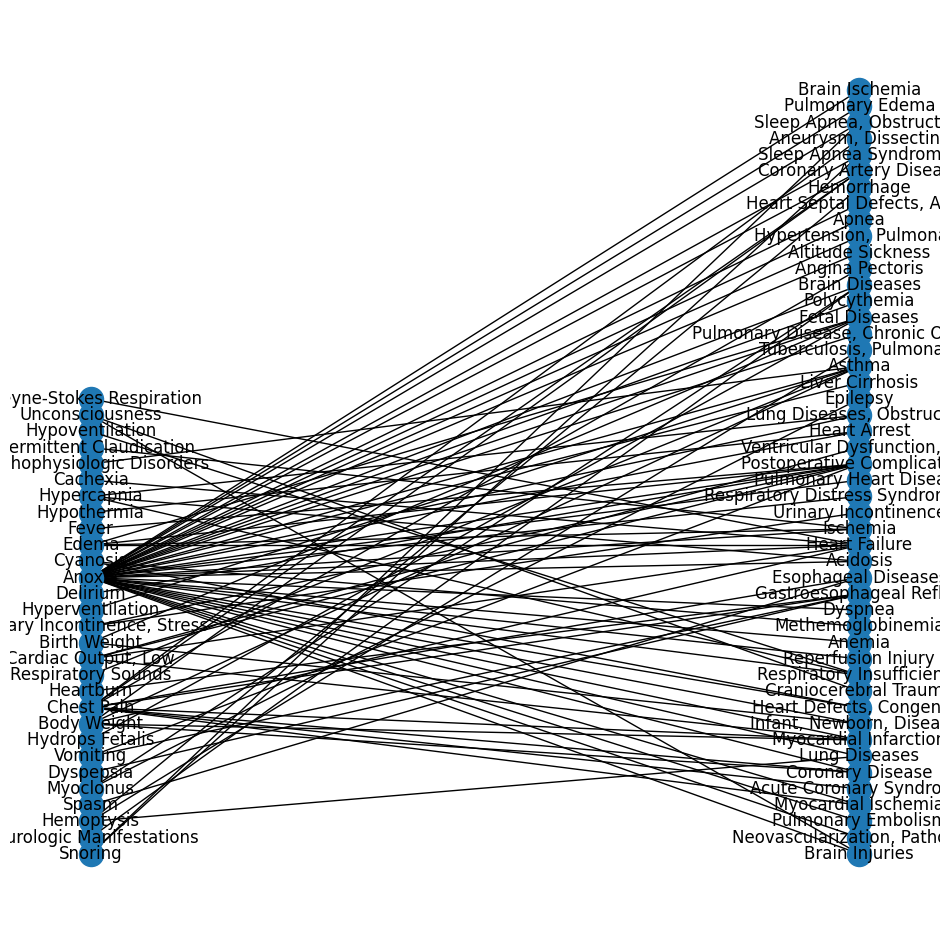

Anoxia :  36
Chest Pain :  9
Body Weight :  5
Edema :  4
Cardiac Output, Low :  4
Hemoptysis :  3
Hypercapnia :  3
Snoring :  2
Myoclonus :  2
Cyanosis :  2
Vomiting :  2
Birth Weight :  2
Urinary Incontinence, Stress :  2
Unconsciousness :  2
Hyperventilation :  1
Neurologic Manifestations :  1
Delirium :  1
Spasm :  1
Fever :  1
Hypothermia :  1
Cachexia :  1
Psychophysiologic Disorders :  1
Dyspepsia :  1
Hydrops Fetalis :  1
Intermittent Claudication :  1
Heartburn :  1
Respiratory Sounds :  1
Hypoventilation :  1
Cheyne-Stokes Respiration :  1

Name community:  Lung or heart problems

Top symptoms: ['Anoxia', 'Chest Pain', 'Body Weight', 'Edema', 'Cardiac Output, Low', 'Hemoptysis', 'Hypercapnia']

Top symptoms detects the 68.82 % of the diseases in the community


In [ ]:
name_comm_all = []
tops_syms_all = []
percs_syms_all = []

for idx in range(0,num_communities):
    print("\n\n----------------------------------------------------------------------------------------------")
    print(idx)
    tops_syms, percs_syms, name_comm = process_one_community(res[idx])
    if tops_syms != ["none"]:
        name_comm_all.append(name_comm)
        tops_syms_all.append(tops_syms)
        percs_syms_all.append(percs_syms)

In [ ]:
# Show all the communities names
print(name_comm_all)

['Mental disorders', 'Bacterial infections', 'Malnutrition deficiency', 'Vision or Pregnancy problems', 'Lung or heart problems']


In [ ]:
# List of all the symptoms
print(tops_syms_all)

[['Hallucinations', 'Psychomotor Disorders', 'Perceptual Disorders', 'Psychomotor Agitation'], ['Diarrhea', 'Abdominal Pain', 'Dyspepsia', 'Constipation', 'Diarrhea, Infantile', 'Abdomen, Acute', 'Vomiting', 'Body Weight'], ['Body Weight', 'Weight Loss', 'Birth Weight', 'Weight Gain', 'Nausea', 'Bulimia', 'Hyperphagia', 'Vomiting'], ['Edema', 'Fever', 'Birth Weight', 'Psychophysiologic Disorders', 'Fatigue', 'Respiratory Sounds', 'Scotoma', 'Amblyopia'], ['Anoxia', 'Chest Pain', 'Body Weight', 'Edema', 'Cardiac Output, Low', 'Hemoptysis', 'Hypercapnia']]


In [ ]:
# Some metrics
avg = stats.mean(percs_syms_all)
med = stats.median(percs_syms_all)
std = stats.stdev(percs_syms_all)
print("Percentages:", percs_syms_all)
print("Avg:", round(avg,2))
print("Std:", round(std,2))
print("Med:", round(med,2))

Percentages: [48.48, 91.18, 77.14, 81.93, 68.82]
Avg: 73.51
Std: 16.16
Med: 77.14


# **Predict the disease category based on symptoms**

In [ ]:
df = pd.DataFrame({'Symptoms': tops_syms_all, 'Disease Category': name_comm_all, 'Percentage': percs_syms_all})

In [ ]:
df

,Symptoms,Disease Category,Percentage
0,"[Hallucinations, Psychomotor Disorders, Percep...",Mental disorders,48.48
1,"[Diarrhea, Abdominal Pain, Dyspepsia, Constipa...",Bacterial infections,91.18
2,"[Body Weight, Weight Loss, Birth Weight, Weigh...",Malnutrition deficiency,77.14
3,"[Edema, Fever, Birth Weight, Psychophysiologic...",Vision or Pregnancy problems,81.93
4,"[Anoxia, Chest Pain, Body Weight, Edema, Cardi...",Lung or heart problems,68.82


In [ ]:
def pred_categ_disease(symtoms):
    for symt in symtoms:
        for idx in range(0,len(df)):
            if symt in df["Symptoms"][idx]:
                diss_categ = df["Disease Category"][idx]
                percent_categ = df["Percentage"][idx]
                print("Predicted disease: "+diss_categ)
                print("Top symptoms detects the "+str(percent_categ)+" % of the diseases in the community")

In [ ]:
pred_categ_disease(["Weight Loss"])

Predicted disease: Malnutrition deficiency
Top symptoms detects the 77.14 % of the diseases in the community


In [ ]:
pred_categ_disease(["Nausea"])

Predicted disease: Malnutrition deficiency
Top symptoms detects the 77.14 % of the diseases in the community


In [ ]:
pred_categ_disease(["Dyspepsia"])

Predicted disease: Bacterial infections
Top symptoms detects the 91.18 % of the diseases in the community


In [ ]:
pred_categ_disease(["Chest Pain"])

Predicted disease: Lung or heart problems
Top symptoms detects the 68.82 % of the diseases in the community


In [ ]:
pred_categ_disease(["Body Weight"])

Predicted disease: Bacterial infections
Top symptoms detects the 91.18 % of the diseases in the community
Predicted disease: Malnutrition deficiency
Top symptoms detects the 77.14 % of the diseases in the community
Predicted disease: Lung or heart problems
Top symptoms detects the 68.82 % of the diseases in the community


In [ ]:
pred_categ_disease(["Fever"])

Predicted disease: Vision or Pregnancy problems
Top symptoms detects the 81.93 % of the diseases in the community


In [ ]:
pred_categ_disease(["Hallucinations"])

Predicted disease: Mental disorders
Top symptoms detects the 48.48 % of the diseases in the community
